# Snowfall Analysis Totals

The National Snowfall Analysis data from NOHRSC estimates snowfall in the recent past by gathering several operational data sets into a unified analysis.
The 6, 24, 48, and 72 hour accumulations can be downloaded. 
The climatological snowfall to liquid equivalent ratio (SLR) was used to generate the snowfall accumulaition totals.

Example data read in downloaded from: https://www.nohrsc.noaa.gov/snowfall/

In [1]:
import netCDF4
from netCDF4 import Dataset

import matplotlib as mpl
import matplotlib.pyplot as plt

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import numpy as np

import datetime
from datetime import datetime, timedelta

import pandas as pd


end = datetime.utcnow()
start = end - timedelta(hours=1)

%config InlineBackend.figure_format='retina'

In [2]:
name_seasonal = 'sfav2_CONUS_2019093012_to_2019112712.nc'
name_24hr = 'sfav2_CONUS_24h_2019112800.nc'
name_48hr = 'sfav2_CONUS_48h_2019112800.nc'
name_72hr = 'sfav2_CONUS_72h_2019112800.nc'

seasonal = Dataset('Desktop/' + name_seasonal)

data_24hr = Dataset('Desktop/'+ name_24hr)
data_48hr = Dataset('Desktop/'+ name_48hr)
data_72hr = Dataset('Desktop/'+ name_72hr)

time_valid = pd.to_datetime(name_24hr[16:-3], format = '%Y%m%d%H')
time_valid_seasonal = pd.to_datetime(name_seasonal[12:22], format = '%Y%m%d%H')

In [3]:
lat = data_24hr['lat'][:]
lon = data_24hr['lon'][:]

seasonal_data = seasonal['Data'][:] * 39.3701
seasonal_data[seasonal_data < .01] = np.nan


snow_data_24hr = data_24hr['Data'][:] * 39.3701
snow_data_24hr[snow_data_24hr < .01] = np.nan

snow_data_48hr = data_48hr['Data'][:] * 39.3701
snow_data_48hr[snow_data_48hr < .01] = np.nan

snow_data_72hr = data_72hr['Data'][:] * 39.3701
snow_data_72hr[snow_data_72hr < .01] = np.nan

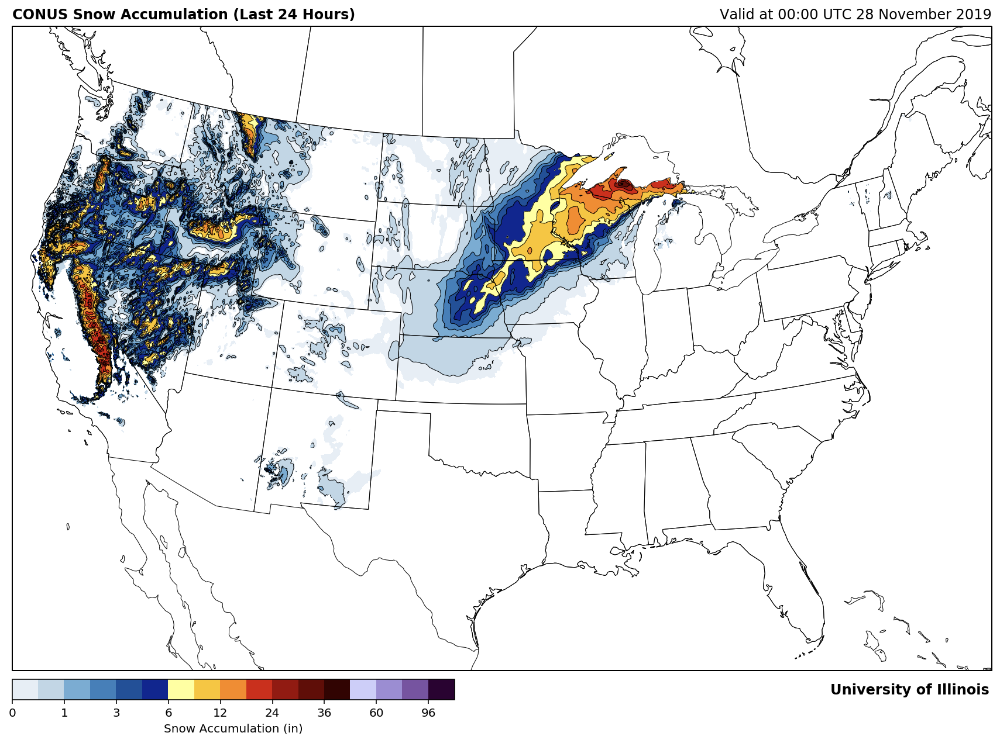

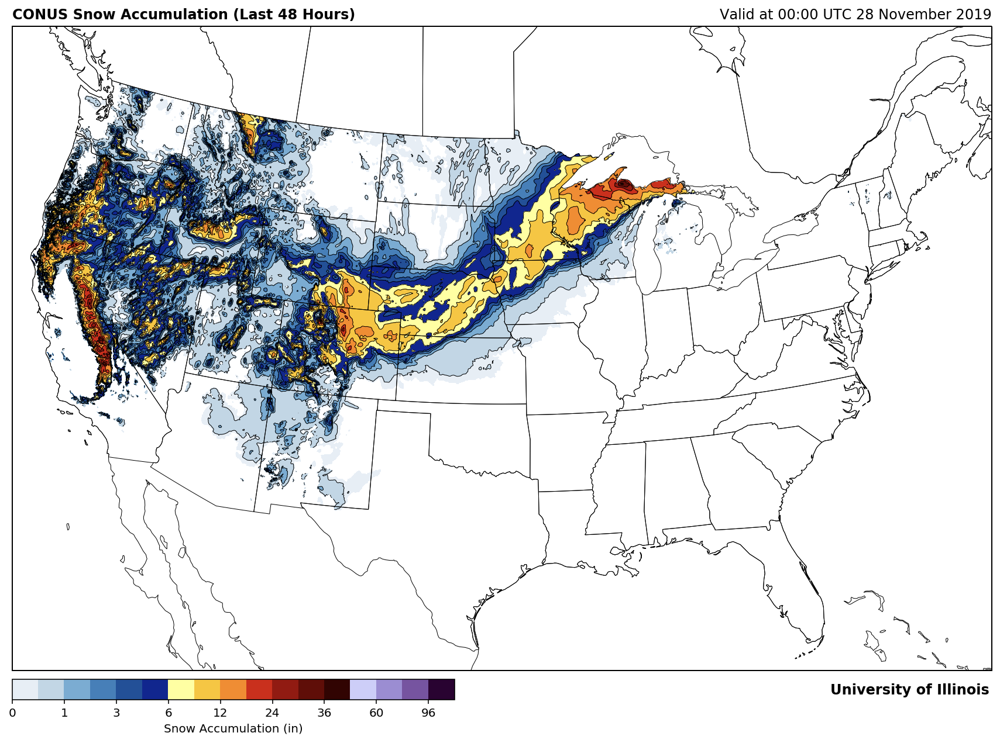

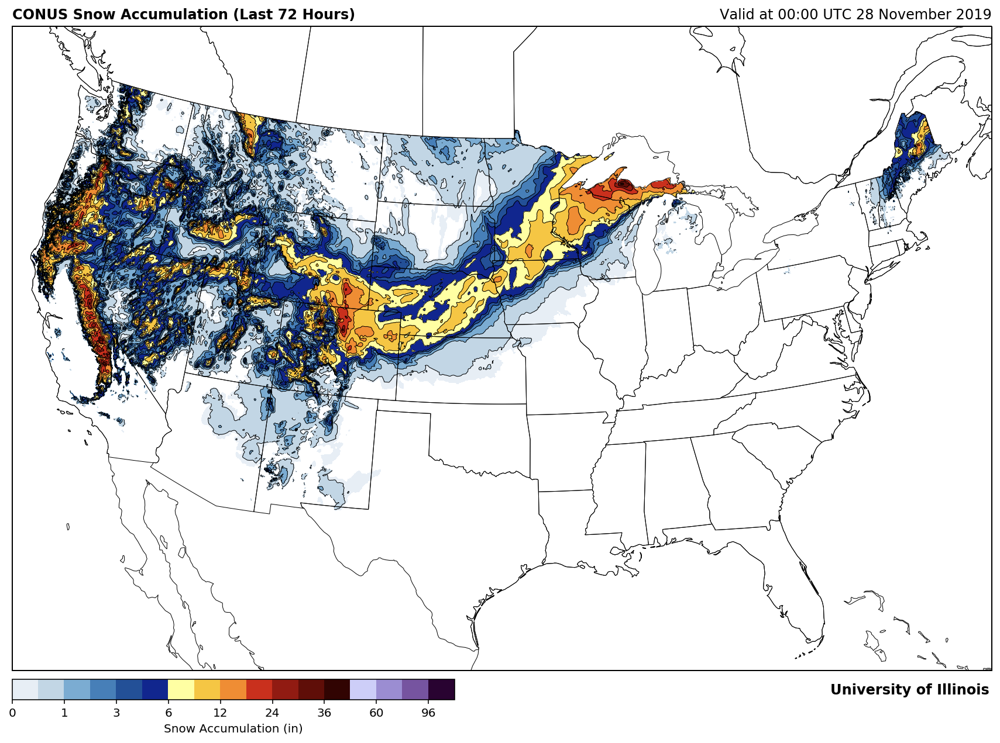

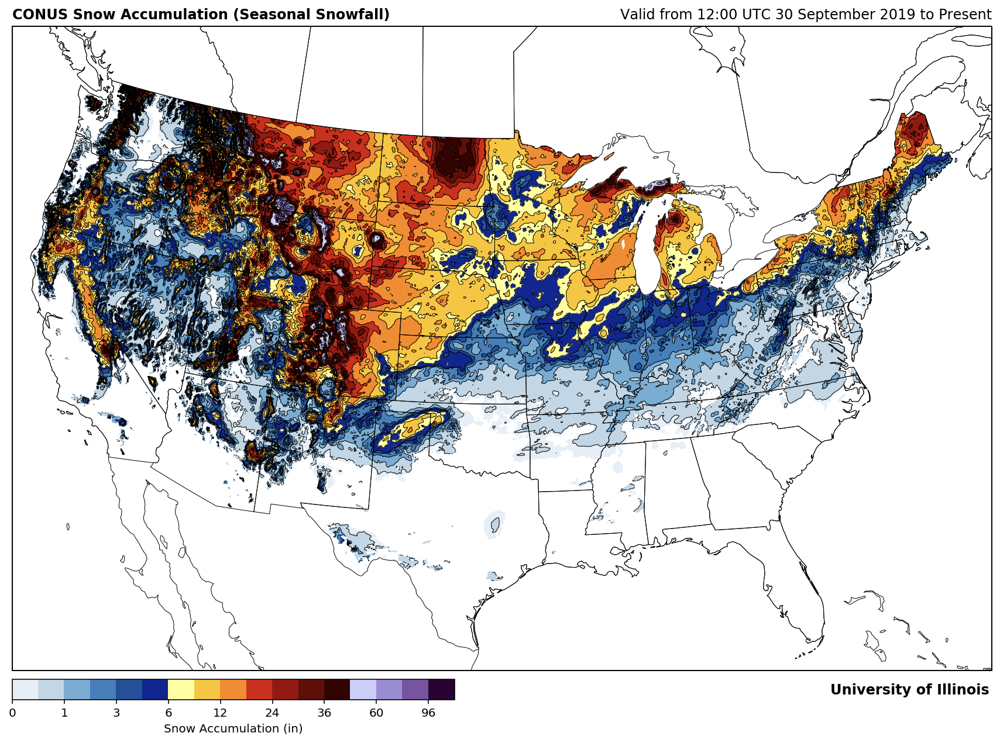

In [4]:
cmap = mpl.colors.ListedColormap(['#e7eef5', '#c2d6e5', '#7bacd2', '#477fb8', '#235097', '#11268e', '#ffffa3', '#f5c644', '#ef8d34', '#c9301d', '#911b12', '#5f0e08', '#310402', '#cdcef8', '#9b8dd2', '#7654a0', '#4f206e', '#290331'])
cmap.set_over('#290331')
cmap.set_under('#ffffff')

bounds = [0, 0.1, 1, 2, 3, 4, 6, 8, 12, 18, 24, 30, 36, 48, 60, 72, 96, 120]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)




fig = plt.figure(figsize=(15, 12))

proj = ccrs.LambertConformal()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-120, -72, 25, 52]
ax.set_extent(extent, crs=ccrs.PlateCarree())

ax.coastlines(resolution='50m', color='black', linewidth=0.5, zorder = 11)
states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='50m', facecolor='none', zorder = 11)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

plt.title('CONUS Snow Accumulation (Last 24 Hours)', loc='left', fontweight='bold')
plt.title(datetime.strftime(time_valid, 'Valid at %H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.125, .155, 0.35, 0.02]) #[left, bottom, width, height]

ax.contour(lon, lat, snow_data_24hr, transform = ccrs.PlateCarree(), zorder = 10, colors = 'black', linewidths = .5, levels = bounds, norm = norm)
cs = ax.contourf(lon, lat, snow_data_24hr, transform = ccrs.PlateCarree(), zorder = 9, cmap = cmap, levels = bounds, norm = norm)

cbar = plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes, label = 'Snow Accumulation (in)')

txt = 'University of Illinois'
plt.figtext(.835, 0.16, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')


plt.show()



fig = plt.figure(figsize=(15, 12))

proj = ccrs.LambertConformal()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-120, -72, 25, 52]
ax.set_extent(extent, crs=ccrs.PlateCarree())

ax.coastlines(resolution='50m', color='black', linewidth=0.5, zorder = 11)
states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='50m', facecolor='none', zorder = 11)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

plt.title('CONUS Snow Accumulation (Last 48 Hours)', loc='left', fontweight='bold')
plt.title(datetime.strftime(time_valid, 'Valid at %H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.125, .155, 0.35, 0.02]) #[left, bottom, width, height]

ax.contour(lon, lat, snow_data_48hr, transform = ccrs.PlateCarree(), zorder = 10, colors = 'black', linewidths = .5, levels = bounds, norm = norm)
cs = ax.contourf(lon, lat, snow_data_48hr, transform = ccrs.PlateCarree(), zorder = 9, cmap = cmap, levels = bounds, norm = norm)

plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes, label = 'Snow Accumulation (in)')

txt = 'University of Illinois'
plt.figtext(.835, 0.16, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()



fig = plt.figure(figsize=(15, 12))

proj = ccrs.LambertConformal()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-120, -72, 25, 52]
ax.set_extent(extent, crs=ccrs.PlateCarree())

ax.coastlines(resolution='50m', color='black', linewidth=0.5, zorder = 11)
states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='50m', facecolor='none', zorder = 11)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

plt.title('CONUS Snow Accumulation (Last 72 Hours)', loc='left', fontweight='bold')
plt.title(datetime.strftime(time_valid, 'Valid at %H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.125, .155, 0.35, 0.02]) #[left, bottom, width, height]

ax.contour(lon, lat, snow_data_72hr, transform = ccrs.PlateCarree(), zorder = 10, colors = 'black', linewidths = .5, levels = bounds, norm = norm)
cs = ax.contourf(lon, lat, snow_data_72hr, transform = ccrs.PlateCarree(), zorder = 9, cmap = cmap, levels = bounds, norm = norm)

plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes, label = 'Snow Accumulation (in)')

txt = 'University of Illinois'
plt.figtext(.835, 0.16, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()



fig = plt.figure(figsize=(15, 12))

proj = ccrs.LambertConformal()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-120, -72, 25, 52]
ax.set_extent(extent, crs=ccrs.PlateCarree())

ax.coastlines(resolution='50m', color='black', linewidth=0.5, zorder = 11)
states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='50m', facecolor='none', zorder = 11)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

plt.title('CONUS Snow Accumulation (Seasonal Snowfall)', loc='left', fontweight='bold')
plt.title(datetime.strftime(time_valid_seasonal, 'Valid from %H:%M UTC %d %B %Y to Present'), loc='right')

cbaxes = fig.add_axes([.125, .155, 0.35, 0.02]) #[left, bottom, width, height]

ax.contour(lon, lat, seasonal_data, transform = ccrs.PlateCarree(), zorder = 10, colors = 'black', linewidths = .5, levels = bounds, norm = norm)
cs = ax.contourf(lon, lat, seasonal_data, transform = ccrs.PlateCarree(), zorder = 9, cmap = cmap, levels = bounds, norm = norm)

plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes, label = 'Snow Accumulation (in)')

txt = 'University of Illinois'
plt.figtext(.835, 0.16, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()

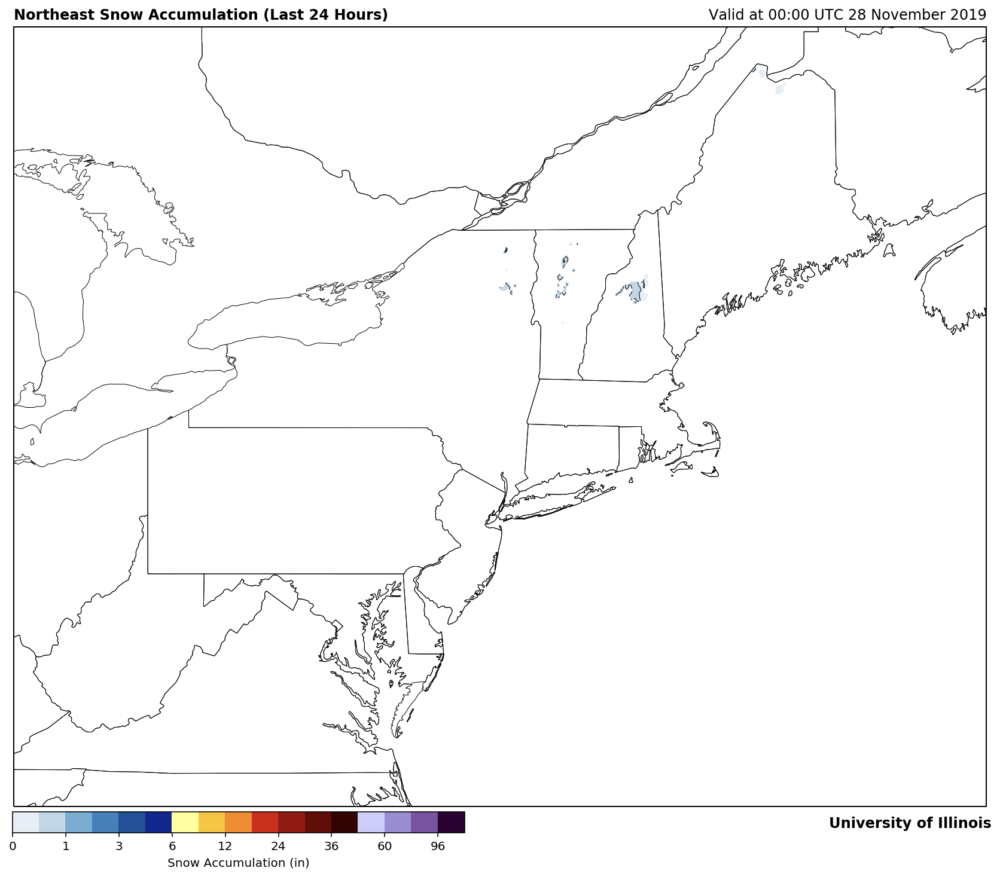

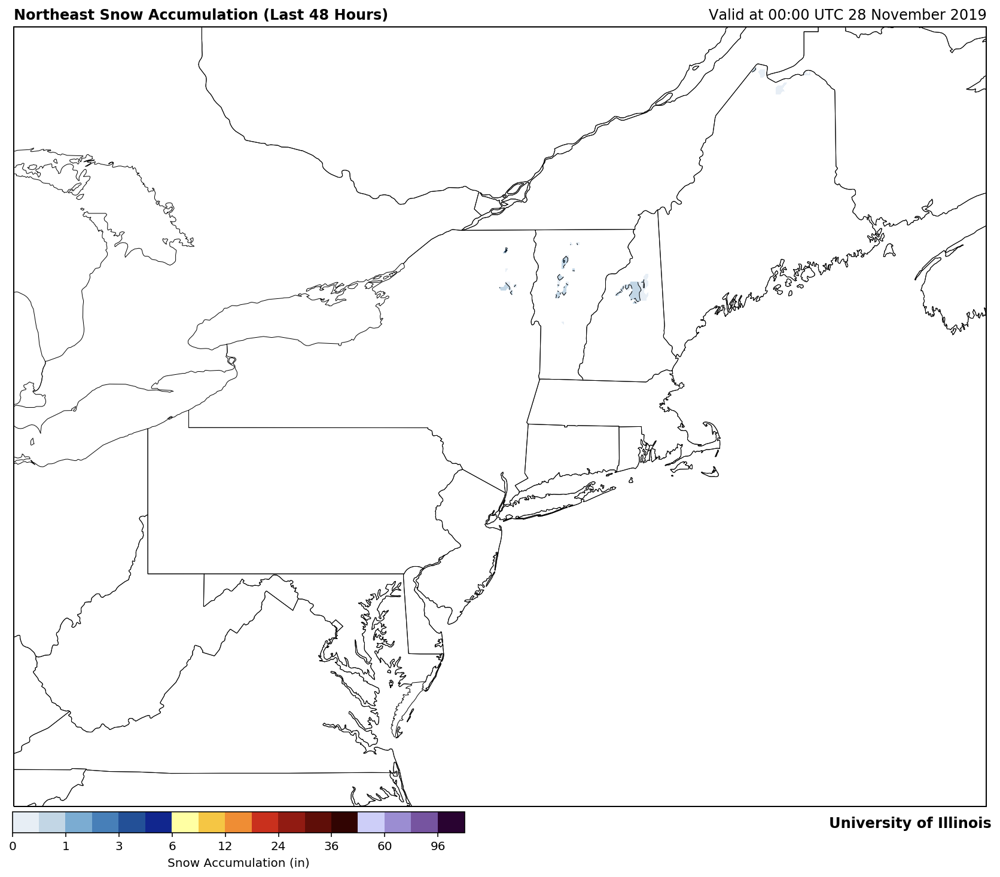

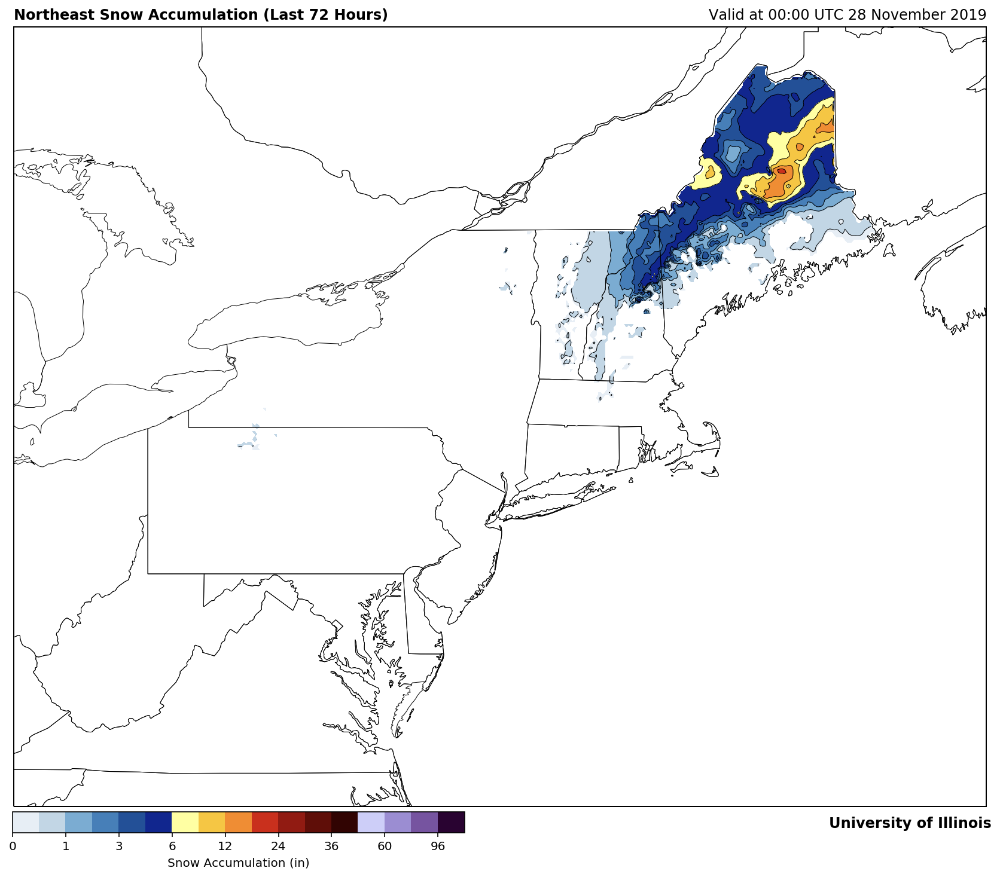

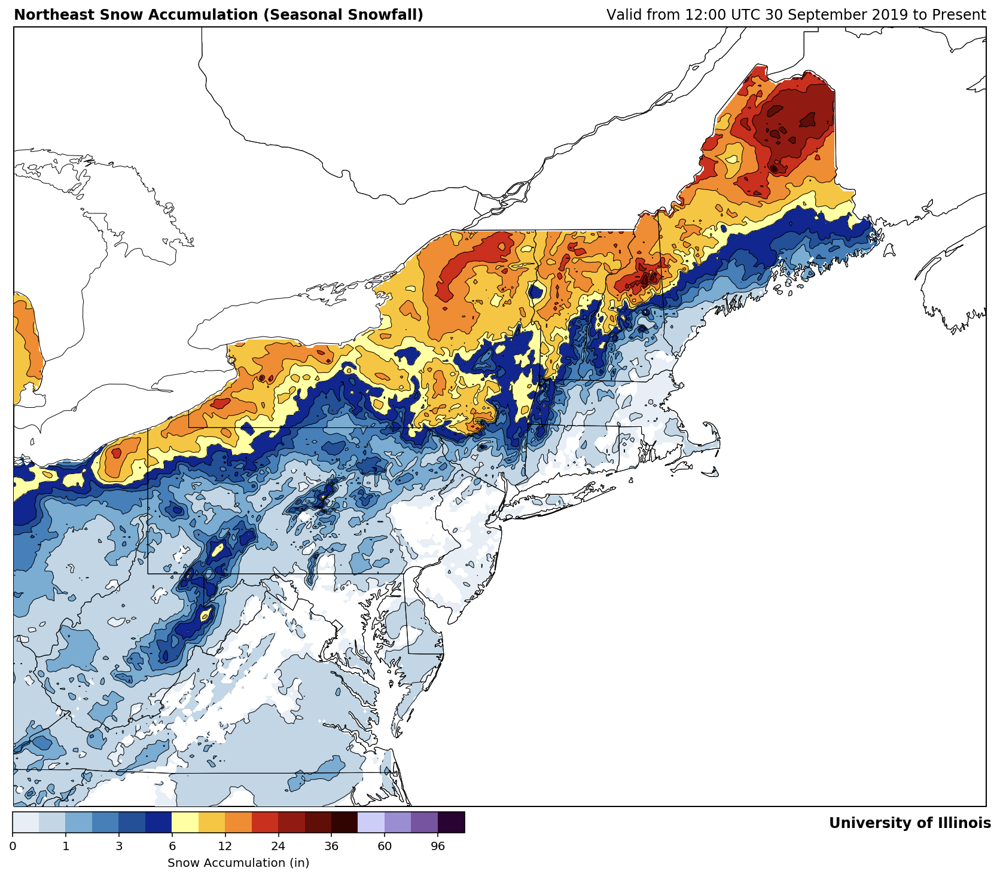

In [5]:
fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-83, -65, 36, 48]
ax.set_extent(extent, crs=ccrs.PlateCarree())

ax.coastlines(resolution='10m', color='black', linewidth=0.5, zorder = 10)

states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='10m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5, zorder = 10)

plt.title('Northeast Snow Accumulation (Last 24 Hours)', loc='left', fontweight='bold')
plt.title(datetime.strftime(time_valid, 'Valid at %H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.135, .1, 0.35, 0.02]) #[left, bottom, width, height]

ax.contour(lon, lat, snow_data_24hr, transform = ccrs.PlateCarree(), zorder = 10, colors = 'black', linewidths = .5, levels = bounds, norm = norm)
cs = ax.contourf(lon, lat, snow_data_24hr, transform = ccrs.PlateCarree(), zorder = 9, cmap = cmap, levels = bounds, norm = norm)

plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes, label = 'Snow Accumulation (in)')

txt = 'University of Illinois'
plt.figtext(.83, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()



fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-83, -65, 36, 48]
ax.set_extent(extent, crs=ccrs.PlateCarree())

ax.coastlines(resolution='10m', color='black', linewidth=0.5, zorder = 10)

states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='10m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5, zorder = 10)

plt.title('Northeast Snow Accumulation (Last 48 Hours)', loc='left', fontweight='bold')
plt.title(datetime.strftime(time_valid, 'Valid at %H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.135, .1, 0.35, 0.02]) #[left, bottom, width, height]

ax.contour(lon, lat, snow_data_48hr, transform = ccrs.PlateCarree(), zorder = 10, colors = 'black', linewidths = .5, levels = bounds, norm = norm)
cs = ax.contourf(lon, lat, snow_data_48hr, transform = ccrs.PlateCarree(), zorder = 9, cmap = cmap, levels = bounds, norm = norm)

plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes, label = 'Snow Accumulation (in)')

txt = 'University of Illinois'
plt.figtext(.83, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()



fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-83, -65, 36, 48]
ax.set_extent(extent, crs=ccrs.PlateCarree())

ax.coastlines(resolution='10m', color='black', linewidth=0.5, zorder = 10)

states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='10m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5, zorder = 10)

plt.title('Northeast Snow Accumulation (Last 72 Hours)', loc='left', fontweight='bold')
plt.title(datetime.strftime(time_valid, 'Valid at %H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.135, .1, 0.35, 0.02]) #[left, bottom, width, height]

ax.contour(lon, lat, snow_data_72hr, transform = ccrs.PlateCarree(), zorder = 10, colors = 'black', linewidths = .5, levels = bounds, norm = norm)
cs = ax.contourf(lon, lat, snow_data_72hr, transform = ccrs.PlateCarree(), zorder = 9, cmap = cmap, levels = bounds, norm = norm)

plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes, label = 'Snow Accumulation (in)')

txt = 'University of Illinois'
plt.figtext(.83, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()



fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-83, -65, 36, 48]
ax.set_extent(extent, crs=ccrs.PlateCarree())

ax.coastlines(resolution='10m', color='black', linewidth=0.5, zorder = 10)

states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='10m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5, zorder = 10)

plt.title('Northeast Snow Accumulation (Seasonal Snowfall)', loc='left', fontweight='bold')
plt.title(datetime.strftime(time_valid_seasonal, 'Valid from %H:%M UTC %d %B %Y to Present'), loc='right')

cbaxes = fig.add_axes([.135, .1, 0.35, 0.02]) #[left, bottom, width, height]

ax.contour(lon, lat, seasonal_data, transform = ccrs.PlateCarree(), zorder = 10, colors = 'black', linewidths = .5, levels = bounds, norm = norm)
cs = ax.contourf(lon, lat, seasonal_data, transform = ccrs.PlateCarree(), zorder = 9, cmap = cmap, levels = bounds, norm = norm)

plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes, label = 'Snow Accumulation (in)')

txt = 'University of Illinois'
plt.figtext(.83, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()

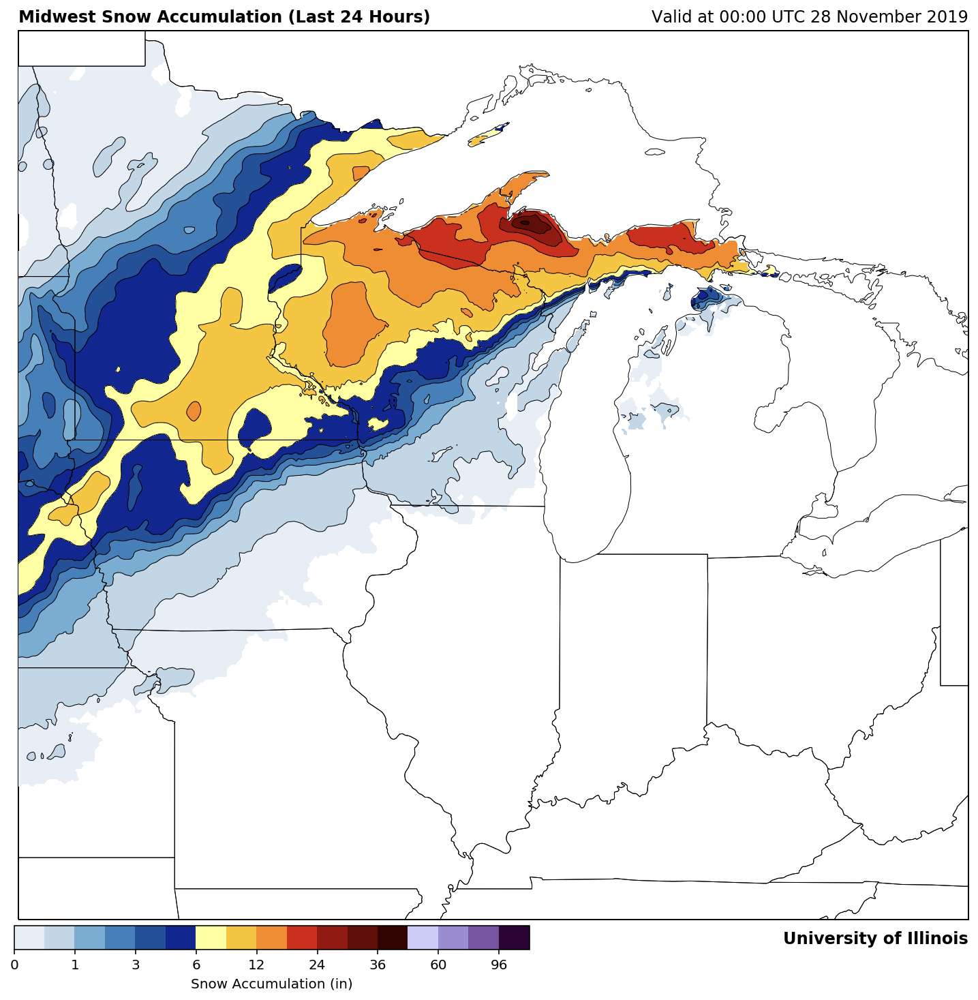

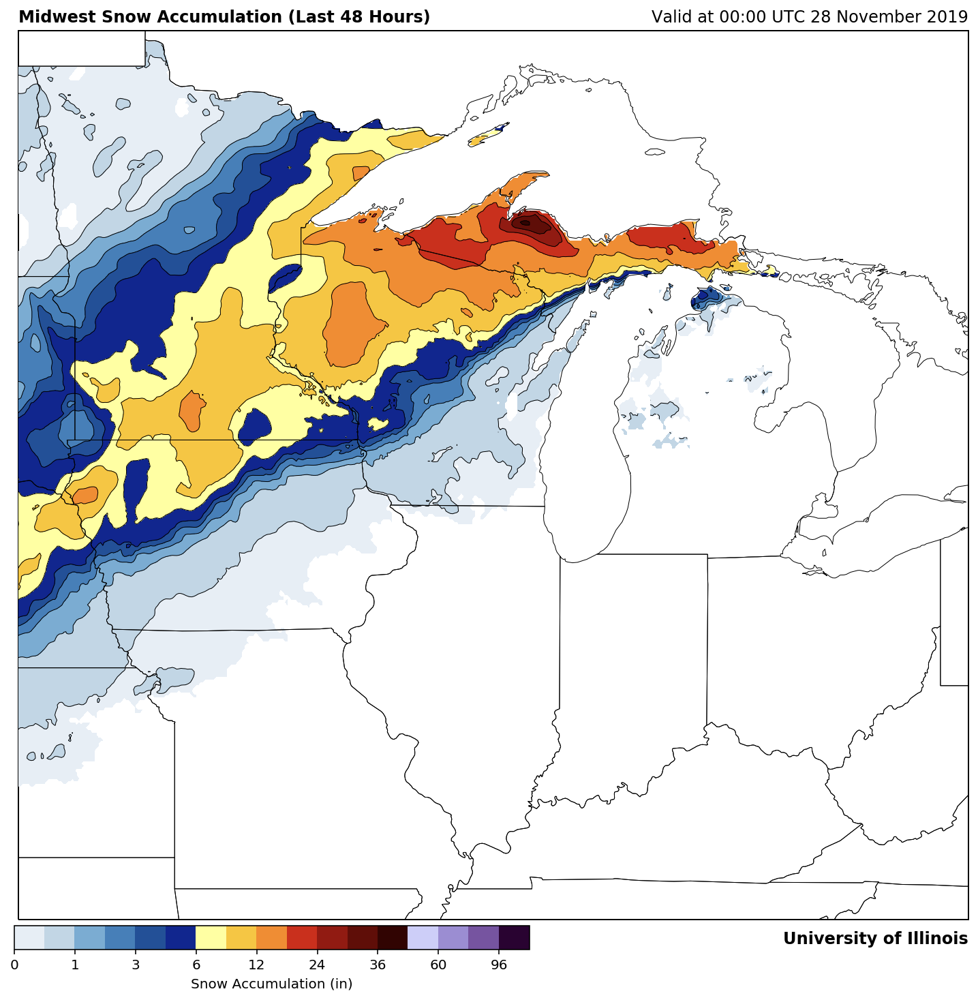

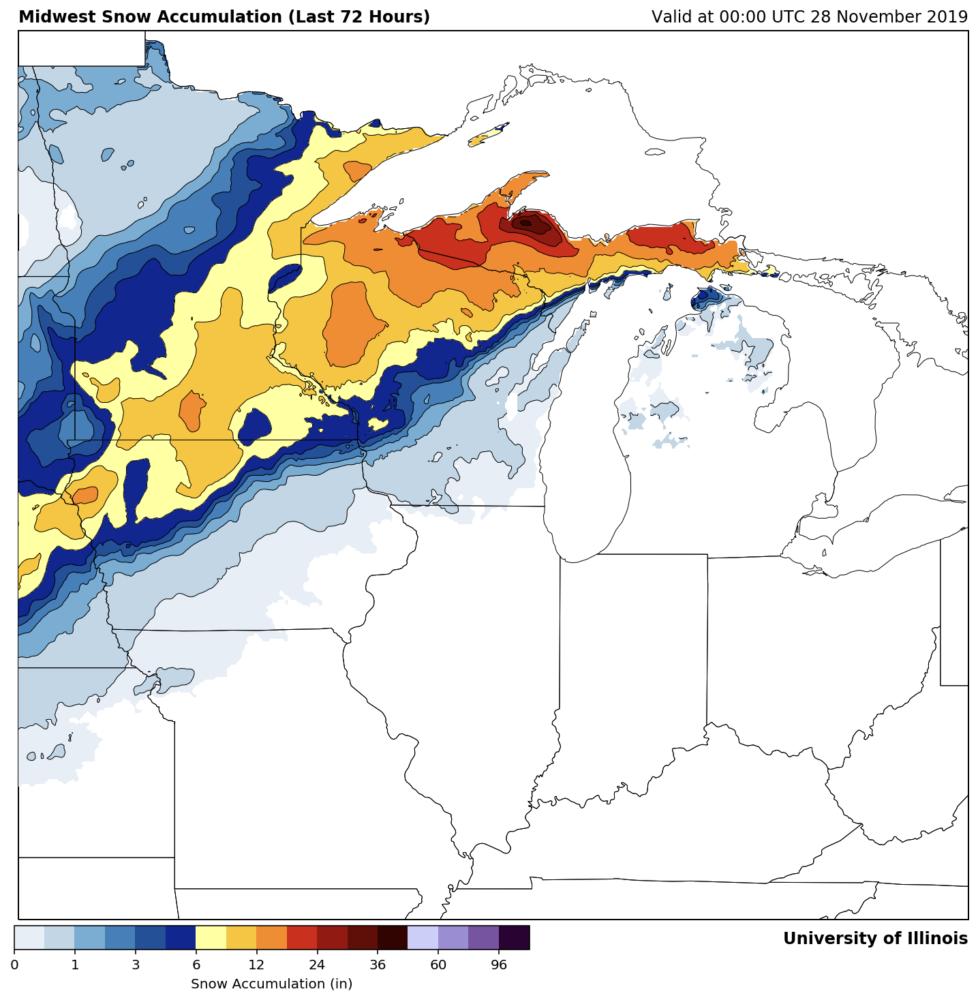

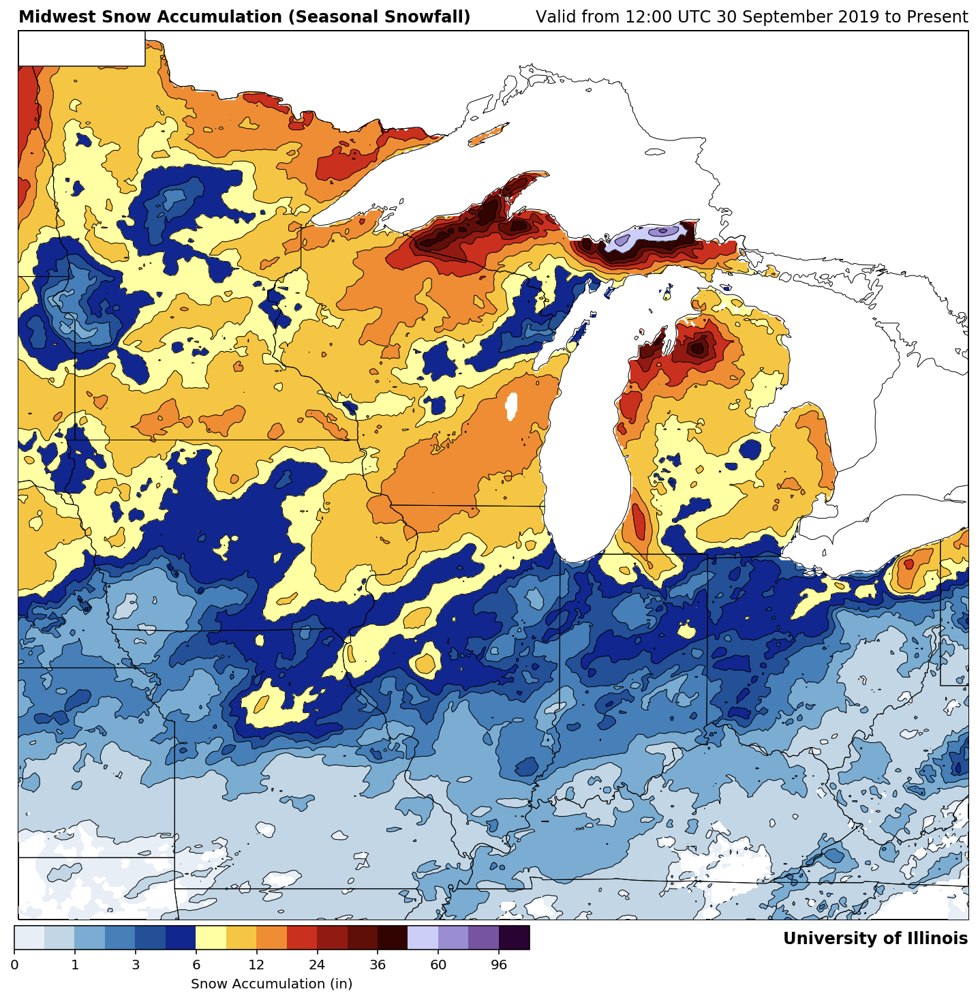

In [6]:
fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-97.5, -80, 36, 49.5]
ax.set_extent(extent, crs=ccrs.PlateCarree())

ax.coastlines(resolution='10m', color='black', linewidth=0.5, zorder = 10)

states_provinces = cfeature.NaturalEarthFeature(category='cultural',name='admin_1_states_provinces_lakes', scale='10m',facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5, zorder = 10)

plt.title('Midwest Snow Accumulation (Last 24 Hours)', loc='left', fontweight='bold')
plt.title(datetime.strftime(time_valid, 'Valid at %H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.187, .1, 0.35, 0.02]) #[left, bottom, width, height]

ax.contour(lon, lat, snow_data_24hr, transform = ccrs.PlateCarree(), zorder = 10, colors = 'black', linewidths = .5, levels = bounds, norm = norm)
cs = ax.contourf(lon, lat, snow_data_24hr, transform = ccrs.PlateCarree(), zorder = 9, cmap = cmap, levels = bounds, norm = norm)

plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes, label = 'Snow Accumulation (in)')

txt = 'University of Illinois'
plt.figtext(.772, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()



fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-97.5, -80, 36, 49.5]
ax.set_extent(extent, crs=ccrs.PlateCarree())

ax.coastlines(resolution='10m', color='black', linewidth=0.5, zorder = 10)

states_provinces = cfeature.NaturalEarthFeature(category='cultural',name='admin_1_states_provinces_lakes', scale='10m',facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5, zorder = 10)

plt.title('Midwest Snow Accumulation (Last 48 Hours)', loc='left', fontweight='bold')
plt.title(datetime.strftime(time_valid, 'Valid at %H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.187, .1, 0.35, 0.02]) #[left, bottom, width, height]

ax.contour(lon, lat, snow_data_48hr, transform = ccrs.PlateCarree(), zorder = 10, colors = 'black', linewidths = .5, levels = bounds, norm = norm)
cs = ax.contourf(lon, lat, snow_data_48hr, transform = ccrs.PlateCarree(), zorder = 9, cmap = cmap, levels = bounds, norm = norm)

plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes, label = 'Snow Accumulation (in)')

txt = 'University of Illinois'
plt.figtext(.772, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()



fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-97.5, -80, 36, 49.5]
ax.set_extent(extent, crs=ccrs.PlateCarree())

ax.coastlines(resolution='10m', color='black', linewidth=0.5, zorder = 10)

states_provinces = cfeature.NaturalEarthFeature(category='cultural',name='admin_1_states_provinces_lakes', scale='10m',facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5, zorder = 10)

plt.title('Midwest Snow Accumulation (Last 72 Hours)', loc='left', fontweight='bold')
plt.title(datetime.strftime(time_valid, 'Valid at %H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.187, .1, 0.35, 0.02]) #[left, bottom, width, height]

ax.contour(lon, lat, snow_data_72hr, transform = ccrs.PlateCarree(), zorder = 10, colors = 'black', linewidths = .5, levels = bounds, norm = norm)
cs = ax.contourf(lon, lat, snow_data_72hr, transform = ccrs.PlateCarree(), zorder = 9, cmap = cmap, levels = bounds, norm = norm)

plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes, label = 'Snow Accumulation (in)')

txt = 'University of Illinois'
plt.figtext(.772, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()



fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-97.5, -80, 36, 49.5]
ax.set_extent(extent, crs=ccrs.PlateCarree())

ax.coastlines(resolution='10m', color='black', linewidth=0.5, zorder = 10)

states_provinces = cfeature.NaturalEarthFeature(category='cultural',name='admin_1_states_provinces_lakes', scale='10m',facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5, zorder = 10)

plt.title('Midwest Snow Accumulation (Seasonal Snowfall)', loc='left', fontweight='bold')
plt.title(datetime.strftime(time_valid_seasonal, 'Valid from %H:%M UTC %d %B %Y to Present'), loc='right')

cbaxes = fig.add_axes([.187, .1, 0.35, 0.02]) #[left, bottom, width, height]

ax.contour(lon, lat, seasonal_data, transform = ccrs.PlateCarree(), zorder = 10, colors = 'black', linewidths = .5, levels = bounds, norm = norm)
cs = ax.contourf(lon, lat, seasonal_data, transform = ccrs.PlateCarree(), zorder = 9, cmap = cmap, levels = bounds, norm = norm)

plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes, label = 'Snow Accumulation (in)')

txt = 'University of Illinois'
plt.figtext(.772, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()